In [1]:
import pdb
import glob
import matplotlib
import numpy as np
import pandas as pd
import xarray as xr
import inversion_tools
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
from IPython.display import HTML
import matplotlib.dates as mdates
import climate_utils.climate_toolbox as ctb
from matplotlib.animation import FuncAnimation

globf = lambda x: [s.split('/')[-1] for s in glob.glob(x)]
pdir  = '/work/noaa/co2/jhollo/processed_transport_data/tm5_tmp'


KeyboardInterrupt



In [ ]:
# ---- configure region, component etc for analysis

# ---- for TM5 run "r0042"
if(0):
    source, component, region, start, nmonths, pft = \
    'bio_resp_tot', 'cos12_2', 1, 2014, 3, 8
    GC_source, GC_start_date, GC_end_date = \
    'resp', '2014-09', '2015-01'

# ---- for ocean residuals associated with 2016 El Nino
if(1):
    source, component, region, start, nmonths, pft, et = \
    'ocean', 'residual', 14, 2016, 2, None, '2016-01'
    GC_source, GC_start_date, GC_end_date = \
    'ocean', '2016-01', '2016-03'

## First read TM5 fluxes, mole fractions, and gridded pressure for vertical interpolation

In [ ]:
fname    = f'{pdir}/{source}_{component}_{region}_{start}_{nmonths}'
mfname   = f'{fname}_mf.nc'
fluxname = f'{fname}_flux.nc'
print(fname)

# ------ read TM5 flux
try:
    if(False): raise FileNotFoundError
    tm5_flux = xr.open_dataset(fluxname)
    print('read flux from file')
    tm5_flux = tm5_flux[list(tm5_flux.data_vars)[0]]
except FileNotFoundError:
    if(component=='residual'):
        tm5_flux = inversion_tools.read_tm5_flux(source, component, region, nmonths, et=et, pft=pft)
    else:
        tm5_flux = inversion_tools.read_tm5_flux(source, component, region, nmonths, start_year=start, pft=pft)
    tm5_flux.to_netcdf(fluxname)

# ------ read T-M5 MF
try:
    if(False): raise FileNotFoundError
    tm5_mf = xr.open_dataset(mfname)
    print('read mf from file')
    tm5_mf = tm5_mf[list(tm5_mf.data_vars)[0]]
except FileNotFoundError:
    if(component=='residual'):
        tm5_mf   = inversion_tools.read_tm5_mf(source, component, region, nmonths, et=et, pft=pft)
    else:
        tm5_mf   = inversion_tools.read_tm5_mf(source, component, region, nmonths, start_year=start, pft=pft)
    tm5_mf.to_netcdf(mfname)

# ------ read TM5 pressure
tm5_p = inversion_tools.read_tm5_pressure(tm5_mf.time.values[0], tm5_mf.time.values[-1])

## Now read GC fluxes, mole fractions, and get approximate list of reference pressures (currently do not have access to gridded pressure)

In [ ]:
reader  = inversion_tools.Reader(GC_source, component, quiet=False)

if(component != 'residual'):
    gc_mf = reader.read_mf(region=region, start_date=GC_start_date, end_date=GC_end_date, pft=pft)
    gc_flux = reader.read_flux(region=region, start_date=GC_start_date, end_date=GC_end_date, pft=pft)
else:
    gc_mf = reader.read_mf(region=region, emission_date=GC_start_date, end_date=GC_end_date, pft=pft)
    gc_flux = reader.read_flux(region=region, emission_date=GC_start_date, end_date=GC_end_date, pft=pft)
gc_p = xr.DataArray([inversion_tools.lev_to_p(lev) for lev in np.arange(len(gc_mf.lev))+1])

#reader  = inversion_tools.Reader('ocean', 'residual', quiet=False)
#gc_mf = reader.read_mf(region=14, emission_date='2016-01', end_date='2016-03')
#gc_flux = reader.read_flux(region=14, emission_date='2016-01', end_date='2016-03')
#gc_p = xr.DataArray([inversion_tools.lev_to_p(lev) for lev in np.arange(len(gc_mf.lev))+1])

## Reindex in time to align the TM5 data with the daily GC data (assume GC time series is longer)

In [ ]:
tm5_mf   = tm5_mf.reindex(time=gc_mf.time).dropna("time")
tm5_p    = tm5_p.reindex(time=gc_mf.time).dropna("time")
tm5_flux = tm5_flux.reindex(time=gc_flux.time).dropna("time")

## Before running comaprisons, visualize the two vertical grids as a sanity check

In [ ]:
fig = plt.figure(figsize=(15,5))
ax1  = fig.add_subplot(121)
ax2  = fig.add_subplot(122)

for ax in [ax1, ax2]:
    LAT,LEV = np.meshgrid(tm5_mf.lat, tm5_mf.lev)
    ax.scatter(LAT, tm5_p.mean(('time', 'lon'))/100, s=1, color='b', marker='.')
    ax.plot(0,0,'.b',label='TM5 time-mean gridded pressure')
    LAT,LEV = np.meshgrid(gc_mf.lat, gc_p)
    ax.scatter(LAT, LEV, s=1, color='r', marker='.')
    ax.plot(0,0,'.r',label='GC reference pressures')
    ax.invert_yaxis()
    ax.set_yscale('log')
    ax.set_ylabel('pressure  [hPa]')
    ax.set_xlabel('lat  [deg]')
ax1.legend(fontsize=14, bbox_to_anchor=(0.66, 1.05))
ax2.set_ylim([1000,300])

ax1.set_title('full column')
ax2.set_title('troposphere')

### And now check the interpolation for reduced set of 9 levels from the GC level set between 1000 and 100 hPa

In [ ]:
var = 's0000245'
sample_levels = xr.DataArray([900, 800, 700, 600, 500, 400, 300, 200, 100])
tmp = f'/work/noaa/co2/jhollo/processed_transport_data/tm5_remappings/{var}_sample_interp.nc'
try:
    if(False): raise FileNotFoundError
    tm5_mf_interp = xr.open_dataset(tmp)['s0000245']
except FileNotFoundError:
    tm5_mf_interp = ctb.log_interp_to_isobars(tm5_mf, tm5_p, sample_levels)
    tm5_mf_interp.to_netcdf(tmp)

In [ ]:
fig = plt.figure(figsize=(15,7))
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)
#tt  = 500
tt  = 27

# ------ plot tm5 native
LAT,LEV = np.meshgrid(tm5_mf.lat, tm5_mf.lev)
MF = tm5_mf.isel(time=tt).mean('lon')
cc = ax1.tricontourf(np.ravel(LAT), np.ravel(tm5_p.isel(time=tt).mean('lon')/100), np.ravel(MF))
LAT,LEV = np.meshgrid(tm5_mf.lat, tm5_mf.lev)
ax1.scatter(LAT, tm5_p.mean(('time', 'lon'))/100, s=0.5, color='b', marker='.')

# ------ plot tm5 interpolated
MF = tm5_mf_interp.isel(time=tt).mean('lon')
cc = plt.contourf(tm5_mf_interp.lat, tm5_mf_interp.plev, MF, levels=cc.levels)
LAT,LEV = np.meshgrid(tm5_mf_interp.lat, tm5_mf_interp.plev)
#plt.scatter(LAT, LEV, c=MF, norm=cc.norm, lw=0.5, edgecolor='k', s=50)
ax2.scatter(LAT, LEV, s=1, color='r', marker='.')

for ax in [ax1, ax2]:
    ax.invert_yaxis()
    ax.set_yscale('log')
    ax.set_ylim([sample_levels.max(),sample_levels.min() - 10])
    ax.set_ylabel('pressure  [hPa]')
    ax.set_xlabel('lat  [deg]')

cbar = fig.colorbar(cc, ax=[ax1, ax2], orientation='horizontal', location='bottom', aspect=50)
cbar.set_label('ocean residual MF response, 2016-01, region 14 [ppm]', fontsize=14)

ax1.set_title('TM5 native levels', fontsize=14)
ax2.set_title('TM5 remapped to select GC levels', fontsize=14)
ax2.yaxis.tick_right()
ax2.yaxis.set_label_position("right")

# Arrow in figure coordinates
ax1.annotate("",
    xy=(0.54, 0.6),      # arrow tip
    xytext=(0.487, 0.6),  # arrow tail
    xycoords=fig.transFigure, textcoords=fig.transFigure,
    arrowprops=dict(arrowstyle="simple",mutation_scale=50,color='k'),
)
# Label above arrow
fig.text(0.512, 0.63, 'REMAP',ha='center',va='bottom', fontsize=14)


## Do full vertical remap of TM5 mole fractions to GC reference pressure levels
### Ultimately will want to change this so the GC also uses 3D pressure data, and ideally switch to isenstropes

In [ ]:
tm5_mf_ongclev = ctb.log_interp_to_isobars(tm5_mf, tm5_p, gc_p)

## Finally, remap TM5 mole fractions and fluxes to the GC horizontal grid

In [ ]:
tm5_mf_ongc   = ctb.conservative_regrid(gc_mf, tm5_mf_ongclev)
tm5_flux_ongc = ctb.conservative_regrid(gc_flux, tm5_flux)

Text(0.512, 0.765, 'REMAP')

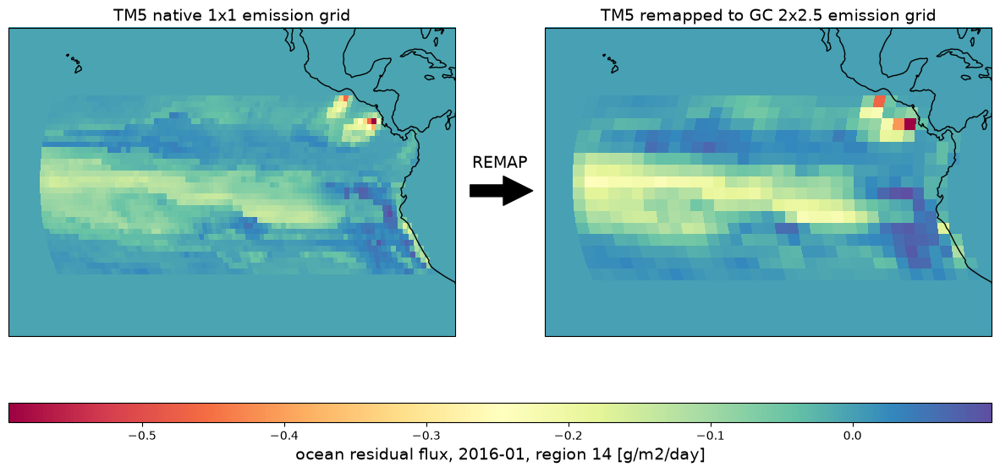

In [41]:
fig = plt.figure(figsize=(15, 15))
ax1 = fig.add_subplot(2, 2, 1, projection=ccrs.Mollweide())
ax2 = fig.add_subplot(2, 2, 2, projection=ccrs.Mollweide())

for ax in [ax1, ax2]:
    ax.set_extent([-165, -72, -20, 20])
    ax.coastlines()

tt = 0

# ------ tm5 flux
lon, lat = tm5_flux.lon.values, tm5_flux.lat.values
cc = ax1.pcolormesh(lon, lat, tm5_flux.isel(time=tt),
                    transform=ccrs.PlateCarree(),
                    shading='auto', cmap='Spectral')

# ------ tm5 remapped flux
lon, lat = tm5_flux_ongc.lon.values, tm5_flux_ongc.lat.values
cc = ax2.pcolormesh(lon, lat, tm5_flux_ongc.isel(time=tt),
                    transform=ccrs.PlateCarree(),
                    shading='auto', cmap='Spectral')

cbar = fig.colorbar(cc, ax=[ax1, ax2], orientation='horizontal', location='bottom', aspect=50)
cbar.set_label('ocean residual flux, 2016-01, region 14 [g/m2/day]', fontsize=14)

ax1.set_title('TM5 native 1x1 emission grid', fontsize=14)
ax2.set_title('TM5 remapped to GC 2x2.5 emission grid', fontsize=14)

# Arrow in figure coordinates
ax1.annotate("",
    xy=(0.54, 0.75),      # arrow tip
    xytext=(0.487, 0.75),  # arrow tail
    xycoords=fig.transFigure, textcoords=fig.transFigure,
    arrowprops=dict(arrowstyle="simple",mutation_scale=50,color='k'),
)
# Label above arrow
fig.text(0.512, 0.765, 'REMAP',ha='center',va='bottom', fontsize=14)

Text(0.512, 0.765, 'REMAP')

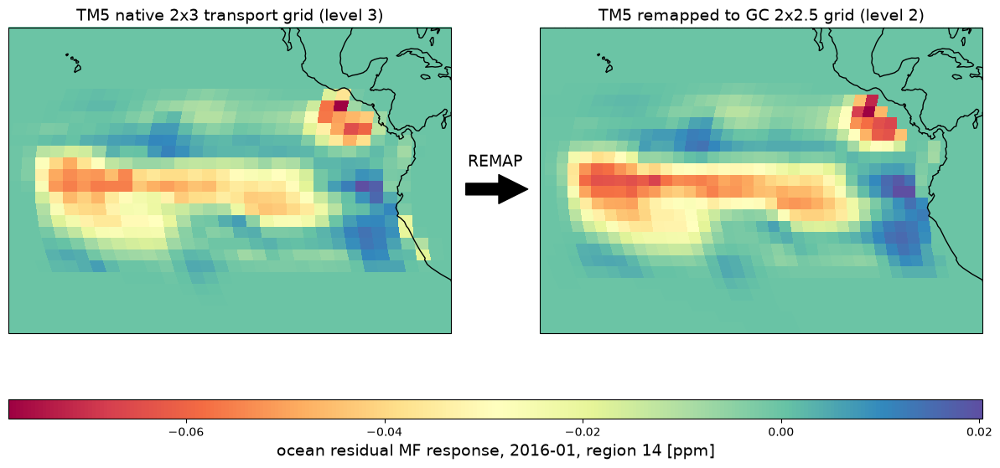

In [42]:
fig = plt.figure(figsize=(15, 15))
ax1 = fig.add_subplot(2, 2, 1, projection=ccrs.Mollweide())
ax2 = fig.add_subplot(2, 2, 2, projection=ccrs.Mollweide())

for ax in [ax1, ax2]:
    ax.set_extent([-165, -72, -20, 20])
    ax.coastlines()

# ------ tm5 mf
lon, lat = tm5_mf.lon.values, tm5_mf.lat.values
cc = ax1.pcolormesh(lon, lat, tm5_mf.isel(time=tt, lev=2),
              transform=ccrs.PlateCarree(),
              shading='auto', cmap='Spectral')

# ------ tm5 remapped mf
lon, lat = tm5_mf_ongc.lon.values, tm5_mf_ongc.lat.values
cc = ax2.pcolormesh(lon, lat, tm5_mf_ongc.isel(time=tt, plev=1),
              transform=ccrs.PlateCarree(),
              shading='auto', cmap='Spectral')

ax1.set_title('TM5 native 2x3 transport grid (level 3)', fontsize=14)
ax2.set_title('TM5 remapped to GC 2x2.5 grid (level 2)', fontsize=14)

cbar = fig.colorbar(cc, ax=[ax1, ax2], orientation='horizontal', location='bottom', aspect=50)
cbar.set_label('ocean residual MF response, 2016-01, region 14 [ppm]', fontsize=14)

# Arrow in figure coordinates
ax1.annotate("",
    xy=(0.54, 0.75),      # arrow tip
    xytext=(0.487, 0.75),  # arrow tail
    xycoords=fig.transFigure, textcoords=fig.transFigure,
    arrowprops=dict(arrowstyle="simple",mutation_scale=50,color='k'),
)
# Label above arrow
fig.text(0.512, 0.765, 'REMAP',ha='center',va='bottom', fontsize=14)

## With the data now on equal-footing, start comparisons
### First, look at mole fraction and flux time series at a fixed gridpoint, evolving in the vertical

In [1]:
tm5c = 'coral'
gcc = 'cornflowerblue'
if(region==14):
    lat, lon = 0, -100
elif(region==1):
    lat, lon = 65, -140
ZM = False
lons = [lon, 'zonal mean'][ZM]

# ---- get data at single point
if(ZM):
    gc_mf_grid    = gc_mf.sel(lat=lat, method='nearest').mean('lon')
    gc_flux_grid  = gc_flux.sel(lat=lat, method='nearest').mean('lon')
    tm5_mf_grid   = tm5_mf_ongc.sel(lat=lat, method='nearest').mean('lon')
    tm5_flux_grid = tm5_flux_ongc.sel(lat=lat, method='nearest').mean('lon')
else:
    gc_mf_grid    = gc_mf.sel(lat=lat, lon=lon, method='nearest')
    gc_flux_grid  = gc_flux.sel(lat=lat, lon=lon, method='nearest')
    tm5_mf_grid   = tm5_mf_ongc.sel(lat=lat, lon=lon, method='nearest')
    tm5_flux_grid = tm5_flux_ongc.sel(lat=lat, lon=lon, method='nearest')

# ---- create figure
fig  = plt.figure()
ax   = fig.add_subplot()
ilev = 1
ax.grid(alpha=0.2)

# ---- plot mf
line_gc,   = ax.plot(gc_mf_grid.time, gc_mf_grid.isel(lev=ilev), color=gcc, label='GC MF')
line_tm5,  = ax.plot(tm5_mf_grid.time, tm5_mf_grid.isel(plev=ilev), color=tm5c, label='REMAPPED TM5 MF')
ax.plot(gc_mf.time[0], [0], '--', color=gcc, label='GC Flux')
ax.plot(tm5_mf.time[0], [0], '--', color=tm5c, label='TM5 Flux')

# ---- plot flux
axf        = plt.gca().twinx()
line_gcf,  = axf.plot(gc_flux_grid.time, gc_flux_grid, '--', color=gcc)
line_tm5f, = axf.plot(tm5_flux_grid.time, tm5_flux_grid, '--', color=tm5c)

# ---- format
ax.tick_params(axis="x", labelrotation=30)
ax.set_ylabel('mole fraction [ppm]')
if(region==14):
    ax.set_xlim([np.datetime64('2015-12-29'), np.datetime64('2016-01-31')])
    if(not ZM):
        ax.set_ylim([-0.26, 0.15])
        axf.set_ylim([-0.08, 0.005])
        ax.legend(loc='lower right', ncol=2)
    else:
        ax.set_ylim([-0.18, 0.05])
        axf.set_ylim([-0.035, 0.002])
        ax.legend(loc='upper right', ncol=2)

def update(ilev):
    ilev+=2
    line_gc.set_ydata(gc_mf_grid.isel(lev=ilev))
    line_tm5.set_ydata(tm5_mf_grid.isel(plev=ilev))
    ax.set_title(f'{source} {component}, region {region}\nlat={lat}, lon={lons}\nlevel={inversion_tools.lev_to_p(ilev+1)} hPa')
    plt.tight_layout()
    return [line_gc, line_tm5]

anim = FuncAnimation(fig, update, frames=len(gc_mf.lev)-2, interval=300, repeat=True, blit=True)
plt.close(fig)
HTML(anim.to_jshtml())

NameError: name 'region' is not defined

### Now look at the zonal mean to better understand the global circulation

In [44]:
tm5c = 'coral'
gcc = 'cornflowerblue'
if(region==14):
    lat, lon = 0, -100
elif(region==1):
    lat, lon = 65, 140
ZM = True
lons = [lon, 'zonal mean'][ZM]

# ---- get data at single point
if(ZM):
    gc_mf_grid    = gc_mf.sel(lat=lat, method='nearest').mean('lon')
    gc_flux_grid  = gc_flux.sel(lat=lat, method='nearest').mean('lon')
    tm5_mf_grid   = tm5_mf_ongc.sel(lat=lat, method='nearest').mean('lon')
    tm5_flux_grid = tm5_flux_ongc.sel(lat=lat, method='nearest').mean('lon')
else:
    gc_mf_grid    = gc_mf.sel(lat=lat, lon=lon, method='nearest')
    gc_flux_grid  = gc_flux.sel(lat=lat, lon=lon, method='nearest')
    tm5_mf_grid   = tm5_mf_ongc.sel(lat=lat, lon=lon, method='nearest')
    tm5_flux_grid = tm5_flux_ongc.sel(lat=lat, lon=lon, method='nearest')

# ---- create figure
fig  = plt.figure()
ax   = fig.add_subplot()
ilev = 1
ax.grid(alpha=0.2)

# ---- plot mf
line_gc,   = ax.plot(gc_mf_grid.time, gc_mf_grid.isel(lev=ilev), color=gcc, label='GC MF')
line_tm5,  = ax.plot(tm5_mf_grid.time, tm5_mf_grid.isel(plev=ilev), color=tm5c, label='REMAPPED TM5 MF')
ax.plot(gc_mf.time[0], [0], '--', color=gcc, label='GC Flux')
ax.plot(tm5_mf.time[0], [0], '--', color=tm5c, label='TM5 Flux')

# ---- plot flux
axf        = plt.gca().twinx()
line_gcf,  = axf.plot(gc_flux_grid.time, gc_flux_grid, '--', color=gcc)
line_tm5f, = axf.plot(tm5_flux_grid.time, tm5_flux_grid, '--', color=tm5c)

# ---- format
ax.tick_params(axis="x", labelrotation=30)
ax.set_ylabel('mole fraction [ppm]')
if(region==14):
    ax.set_xlim([np.datetime64('2015-12-29'), np.datetime64('2016-01-31')])
    if(not ZM):
        ax.set_ylim([-0.26, 0.15])
        axf.set_ylim([-0.08, 0.005])
        ax.legend(loc='lower right', ncol=2)
    else:
        ax.set_ylim([-0.18, 0.05])
        axf.set_ylim([-0.035, 0.002])
        ax.legend(loc='upper right', ncol=2)

def update(ilev):
    ilev+=2
    line_gc.set_ydata(gc_mf_grid.isel(lev=ilev))
    line_tm5.set_ydata(tm5_mf_grid.isel(plev=ilev))
    ax.set_title(f'{source} {component}, region {region}\nlat={lat}, lon={lons}\nlevel={inversion_tools.lev_to_p(ilev+1)} hPa')
    plt.tight_layout()
    return [line_gc, line_tm5]

anim = FuncAnimation(fig, update, frames=len(gc_mf.lev)-2, interval=300, repeat=True, blit=True)
plt.close(fig)
HTML(anim.to_jshtml())

<Figure size 640x480 with 0 Axes>

## Is the large difference between TM5, GC simply a scaling issue? Or is this a genuine difference in transport out of the tropics?
### To check, let's look at the meridional plane in each model, and evolve them in time

In [45]:
tm5c = 'coral'
gcc = 'cornflowerblue'
lat, lon = 0, -100
times = tm5_mf.time.values

# ---- get data at single point
gc_mf_zm  = gc_mf.mean('lon')
tm5_mf_zm = tm5_mf_ongc.mean('lon')

# ---- create figure
fig  = plt.figure(figsize=(10,5))
ax1  = fig.add_subplot(121)
ax2  = fig.add_subplot(122)

# ---- initial plot
c_gc  = ax1.contourf(gc_mf_zm.lat, tm5_mf_zm.plev, gc_mf_zm.sel(time=times[20]), cmap='viridis')
c_tm5 = ax2.contourf(tm5_mf_zm.lat, tm5_mf_zm.plev, tm5_mf_zm.sel(time=times[20]), cmap='viridis', 
                     levels=c_gc.levels, extend='both')
cbar = fig.colorbar(c_gc, ax=[ax1, ax2], orientation='horizontal', location='bottom', aspect=50)
cbar.set_label('Zonal-mean ocean residual MF response, 2016-01, region 14 [ppm]', fontsize=14)
levels = c_gc.levels


def update(i):

    ax1.clear()
    ax2.clear()

    c_gc  = ax1.contourf(gc_mf_zm.lat, tm5_mf_zm.plev, gc_mf_zm.sel(time=times[i]), cmap='viridis', 
                         levels=levels)
    c_tm5 = ax2.contourf(tm5_mf_zm.lat, tm5_mf_zm.plev, tm5_mf_zm.sel(time=times[i]), cmap='viridis', 
                         levels=c_gc.levels, extend='both')

    # ---- format
    ax1.set_title('GC')
    ax2.set_title('TM5')
    for ax in [ax1, ax2]:
        ax.set_ylim([50, 1000])
        ax.set_ylabel('pressure [hPa]')
        ax.invert_yaxis()
        ax.set_yscale('log')
        ax.grid(alpha=0.2)
    ax2.yaxis.tick_right()
    fig.suptitle(f'date={str(times[i]).split("T")[0]}')
    
    return [c_gc, c_tm5]

anim = FuncAnimation(fig, update, frames=len(tm5_mf.time)-1, interval=300, repeat=True)
plt.close(fig)
HTML(anim.to_jshtml())

## And now taking the difference

In [46]:
tm5c = 'coral'
gcc = 'cornflowerblue'
lat, lon = 0, -100
times = tm5_mf.time.values

# ---- get data at single point
gc_mf_zm  = gc_mf.mean('lon')
tm5_mf_zm = tm5_mf_ongc.mean('lon')

gc_mf_zm = gc_mf_zm.rename({'lev':'plev'})
gc_mf_zm = gc_mf_zm.assign_coords(plev=tm5_mf_zm.plev.values)

# ---- create figure
fig  = plt.figure()
ax   = fig.add_subplot(111)

# ---- initial plot
levels = [-0.04, -0.035, -0.03, -0.025, -0.02, -0.015, -0.01, -0.005, 0, 0.005]
levels = [-0.005, -0.001, -0.0005, -0.0001, 0, 0.0001, 0.0005, 0.001, 0.005]
levels = [-0.1, -0.01, -0.001, -0.0001, 0, 0.0001, 0.001, 0.01, 0.1]
c_gc  = ax.contourf(gc_mf_zm.lat, tm5_mf_zm.plev, gc_mf_zm.sel(time=times[20]) - tm5_mf_zm.sel(time=times[20]), 
                    cmap='RdBu', levels=levels, extend='both', norm=matplotlib.colors.BoundaryNorm(levels, ncolors=256))
cbar = fig.colorbar(c_gc, ax=ax, orientation='horizontal', location='bottom', aspect=30)
cbar.set_label('Zonal-mean ocean residual MF response\n2016-01, region 14 [ppm]', fontsize=14)
#cbar.ax.tick_params(axis="x", labelrotation=30)
cbar.ax.xaxis.set_ticklabels([f'{l:.0e}'.replace('e-0', 'e-').replace('e+0', 'e+') for l in levels])
levels = c_gc.levels
plt.tight_layout()
fig.subplots_adjust(top=0.88)


def update(i):

    ax.clear()

    c_gc  = ax.contourf(gc_mf_zm.lat, tm5_mf_zm.plev, gc_mf_zm.sel(time=times[i])-tm5_mf_zm.sel(time=times[i]), cmap='RdBu_r', 
                         levels=levels, norm=matplotlib.colors.BoundaryNorm(levels, ncolors=256))

    # ---- format
    ax.set_title(f'(GC − TM5)\ndate={str(times[i]).split("T")[0]}')
    ax.set_ylim([50, 1000])
    ax.set_ylabel('pressure [hPa]')
    ax.invert_yaxis()
    ax.set_yscale('log')
    ax.grid(alpha=0.2)
    plt.tight_layout()
    
    return [c_gc]

anim = FuncAnimation(fig, update, frames=len(tm5_mf.time)-1, interval=300, repeat=True)
plt.close(fig)
HTML(anim.to_jshtml())

<Figure size 640x480 with 0 Axes>